<a href="https://colab.research.google.com/github/AlishaJoy/SAR_de-speckling_angstromers/blob/main/Copy_final_SAR2SAR_Single_Look_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
"""!rm -rf /content/* #This is to remove all content. Make only run this cell to remove all content from files storage"""
#uncomment the above line only if you want to clear all the files

'!rm -rf /content/* #This is to remove all content. Make only run this cell to remove all content from files storage'

**[Download the notebook](https://gitlab.telecom-paris.fr/ring/sar2sar/-/raw/master/SAR2SAR_Single_Look_test.ipynb?inline=false) and then import it under Google Colab**

<a href="https://colab.research.google.com/" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SAR2SAR: A Semi-Supervised Despeckling Algorithm for SAR Images
## Emanuele Dalsasso, Loïc Denis, Florence Tupin

The code is made available under the **GNU General Public License v3.0**: Copyright 2020, Emanuele Dalsasso, Loïc Denis, Florence Tupin, of LTCI research lab - Télécom ParisTech, an Institut Mines Télécom school.
All rights reserved.

Please note that the training set is only composed of **Sentinel-1** SAR images, thus this testing code is specific to this data.

## Resources
- [Paper (ArXiv)](https://arxiv.org/abs/2006.15037)
- [IEEE JSTARS publication](https://ieeexplore.ieee.org/document/9399231)

To cite the article:
```
E. Dalsasso, L. Denis and F. Tupin,
"SAR2SAR: A Semi-Supervised Despeckling Algorithm for SAR Images,"
in IEEE Journal of Selected Topics in Applied Earth Observations and Remote Sensing,
vol. 14, pp. 4321-4329, 2021, doi: 10.1109/JSTARS.2021.3071864.

```

## 0. Enable GPU and save copy on Drive to enable editing
Runtime -> Change runtime type -> Hardware accelerator: GPU

File -> Save a copy in Drive

## 1. Download network weights and code

In [ ]:
!wget https://gitlab.telecom-paris.fr/ring/SAR2SAR/-/raw/master/network_weights/SAR2SAR-test.zip
!unzip /content/SAR2SAR-test.zip

--2024-12-08 08:27:54--  https://gitlab.telecom-paris.fr/ring/SAR2SAR/-/raw/master/network_weights/SAR2SAR-test.zip
Resolving gitlab.telecom-paris.fr (gitlab.telecom-paris.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to gitlab.telecom-paris.fr (gitlab.telecom-paris.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://gitlab.telecom-paris.fr/ring/sar2sar/-/raw/master/network_weights/SAR2SAR-test.zip [following]
--2024-12-08 08:27:56--  https://gitlab.telecom-paris.fr/ring/sar2sar/-/raw/master/network_weights/SAR2SAR-test.zip
Reusing existing connection to gitlab.telecom-paris.fr:443.
HTTP request sent, awaiting response... 200 OK
Length: 27201489 (26M) [application/octet-stream]
Saving to: ‘SAR2SAR-test.zip’

SAR2SAR-test.zip    100%[===================>]  25.94M  7.15MB/s    in 3.6s    

2024-12-08 08:28:00 (7.15 MB/s) - ‘SAR2SAR-test.zip’ saved [27201489/27201489]

Archive:  /content/SAR2SAR-test.zip
   cre

## 2. Install compatible version of tensorflow

In [ ]:
!wget https://repo.anaconda.com/miniconda/Miniconda3-py38_4.12.0-Linux-x86_64.sh
!chmod +x Miniconda3-py38_4.12.0-Linux-x86_64.sh
!./Miniconda3-py38_4.12.0-Linux-x86_64.sh -b -f -p /usr/local
!conda update conda


--2024-12-08 08:28:45--  https://repo.anaconda.com/miniconda/Miniconda3-py38_4.12.0-Linux-x86_64.sh
Resolving repo.anaconda.com (repo.anaconda.com)... 104.16.32.241, 104.16.191.158, 2606:4700::6810:20f1, ...
Connecting to repo.anaconda.com (repo.anaconda.com)|104.16.32.241|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 76120962 (73M) [application/x-sh]
Saving to: ‘Miniconda3-py38_4.12.0-Linux-x86_64.sh’

Miniconda3-py38_4.1 100%[===================>]  72.59M  49.2MB/s    in 1.5s    

2024-12-08 08:28:47 (49.2 MB/s) - ‘Miniconda3-py38_4.12.0-Linux-x86_64.sh’ saved [76120962/76120962]

PREFIX=/usr/local
Unpacking payload ...
Solving environment: / - \ done

## Package Plan ##

  environment location: /usr/local

  added / updated specs:
    - _libgcc_mutex==0.1=main
    - _openmp_mutex==4.5=1_gnu
    - brotlipy==0.7.0=py38h27cfd23_1003
    - ca-certificates==2022.3.29=h06a4308_1
    - certifi==2021.10.8=py38h06a4308_2
    - cffi==1.15.0=py38hd667e15_1
   

In [ ]:
import sys
sys.path.append('/usr/local/lib/python3.8/site-packages')

In [ ]:
!conda --version

conda 4.12.0


In [ ]:
!conda create -n myenv python=3.6 -y

Solving environment: | failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: \ | / - \ | / done


==> WARNING: A newer version of conda exists. <==
  current version: 4.12.0
  latest version: 24.11.0

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /usr/local/envs/myenv

  added / updated specs:
    - python=3.6


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2021.5.30          |   py36h06a4308_0         139 KB
    openssl-1.1.1w             |       h7f8727e_0         3.7 MB
    pip-21.2.2                 |   py36h06a4308_0         1.8 MB
    python-3.6.13              |       h12debd9_1        32.5 MB
    setuptools-58.0.4          |   py36h06a4308_0         788 KB
    ------------------------------------------------------------
    

In [ ]:
%%shell
eval "$(conda shell.bash hook)"
conda activate myenv
pip3 install tensorflow-gpu==1.13.1

     |████████████████████████████████| 345.2 MB 2.6 kB/s 
     |████████████████████████████████| 42 kB 2.0 MB/s 
     |████████████████████████████████| 126 kB 67.5 MB/s 
     |████████████████████████████████| 1.1 MB 50.5 MB/s 
     |████████████████████████████████| 14.8 MB 61.4 MB/s 
     |████████████████████████████████| 3.2 MB 31.6 MB/s 
     |████████████████████████████████| 367 kB 54.6 MB/s 
     |████████████████████████████████| 50 kB 10.2 MB/s 
     |████████████████████████████████| 4.6 MB 38.3 MB/s 
     |████████████████████████████████| 4.0 MB 60.2 MB/s 
     |████████████████████████████████| 97 kB 10.9 MB/s 
     |████████████████████████████████| 289 kB 70.1 MB/s 
  Created wheel for termcolor: filename=termcolor-1.1.0-py3-none-any.whl size=4848 sha256=e7a373f2ee1ae9038f51cdac5254ae4dada9637e801c27036bae5ebab128494f
  Stored in directory: /root/.cache/pip/wheels/93/2a/eb/e58dbcbc963549ee4f065ff80a59f274cc7210b6eab962acdc
Successfully built termcolor


In [ ]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("Available GPUs:", tf.config.list_physical_devices('GPU'))


TensorFlow version: 2.17.1
Available GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
!conda install -n myenv pillow
!conda install -n myenv scipy

Solving environment: | / failed with initial frozen solve. Retrying with flexible solve.
Solving environment: \ | / failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: - \ | / - \ | / - \ | done


==> WARNING: A newer version of conda exists. <==
  current version: 4.12.0
  latest version: 24.11.0

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /usr/local/envs/myenv

  added / updated specs:
    - pillow


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    freetype-2.12.1            |       h4a9f257_0         626 KB
    jpeg-9e                    |       h5eee18b_3         262 KB
    lcms2-2.12                 |       h3be6417_0         312 KB
    lerc-3.0                   |       h295c915_0         196 KB
    libdeflate-1.17  

In [ ]:
!conda install -n myenv cudatoolkit=10.0 cudnn=7.6.5 -c conda-forge
!conda install -n myenv pillow
!conda install -n myenv scipy

Solving environment: / - \ | / done


==> WARNING: A newer version of conda exists. <==
  current version: 4.12.0
  latest version: 24.11.0

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /usr/local/envs/myenv

  added / updated specs:
    - cudatoolkit=10.0
    - cudnn=7.6.5


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2024.8.30  |       hbcca054_0         155 KB  conda-forge
    certifi-2016.9.26          |           py36_0         217 KB  conda-forge
    cudatoolkit-10.0.130       |      h8c5a6a4_10       336.3 MB  conda-forge
    cudnn-7.6.5                |       cuda10.0_0       165.0 MB
    openssl-1.1.1l             |       h7f98852_0         2.1 MB  conda-forge
    ------------------------------------------------------------
                                           Total

## 3. Test on real data
Some **Sentinel-1** images in **amplitude** format can be found in the folder _/content/SAR2SAR-test/test_data/_


To test on custom data, upload your single channel Sentinel-1 images in a numpy array with shape [ydim, xdim] in the folder _/content/SAR2SAR-test/test_data/_

Results are stored in _/content/test_

At each time a test is run, clean the _/content/test_ directory otherwise the results will be overwritten.

In [ ]:
import os
print("Current Working Directory:", os.getcwd())


Current Working Directory: /content


In [ ]:
!source activate myenv && python /content/SAR2SAR-test/main.py

/usr/local/envs/myenv/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/envs/myenv/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/envs/myenv/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/envs/myenv/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.

When image dimension exeeds 256, the U-Net is scanned over the image with a default stride of 64 pixels. To change it to a custom value, run the cell below (here it is set to 32, allowing more quality at the cost of a greater runtime)

In [ ]:
import numpy as np


In [ ]:
import numpy as np

# Load the numpy file
data = np.load('/content/SAR2SAR-test/test_data/reshaped_output_again_data2.npy')

# Print the shape of the loaded data
print("Shape of data:", data.shape)

# Print the total number of elements in the array
print("Total number of elements:", data.size)


Shape of data: (256, 256)
Total number of elements: 65536


denoised_lely **npy** and png

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/SAR2SAR-test/test_data/reshaped_output_again_data2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


Shape of the array: (256, 256)
Content of the array: [[134 153 147 ... 163  95 106]
 [280  83 188 ...  62  99 114]
 [  5  91 134 ... 247 109 249]
 ...
 [131  46  40 ... 136 166 144]
 [142 201 202 ... 103  99  89]
 [117 154 160 ...  24  57 155]]


Shape of the array: (256, 256)
Content of the array: [[159.86723  158.43839  155.633    ... 150.71251  154.11877  157.323   ]
 [158.96646  159.60933  155.97919  ... 159.20299  158.09787  164.64603 ]
 [140.63635  155.71999  154.97198  ... 174.76407  171.57909  172.84846 ]
 ...
 [129.19765  128.889    127.88073  ... 129.74959  127.483894 124.41595 ]
 [129.26358  128.34709  134.83037  ... 127.74167  127.16163  123.24482 ]
 [128.1211   132.55038  139.78352  ... 121.46861  118.078415 119.63754 ]]


(-0.5, 255.5, 255.5, -0.5)

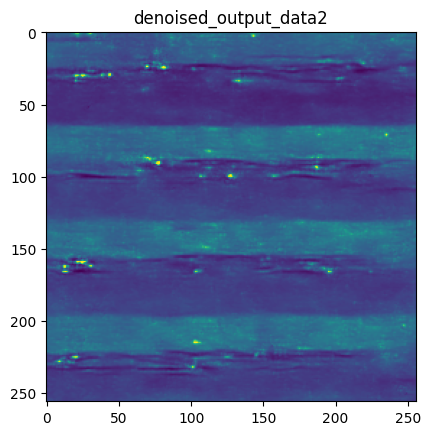

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_reshaped_output_again_data2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_reshaped_output_again_data2.png'
img = mpimg.imread(image_path)

title = "denoised_output_data2"
plt.imshow(img)
plt.title(title)
plt.axis('on')


Shape of the array: (256, 256)
Content of the array: [[133.99997  152.99992  146.99988  ... 162.99982   94.99999  105.99997 ]
 [279.99997   82.999985 187.99992  ...  61.999992  98.999954 114.00001 ]
 [  4.999999  90.99999  133.99997  ... 246.99992  109.000015 248.99985 ]
 ...
 [131.00002   45.999966  39.999992 ... 136.       166.00005  144.      ]
 [142.00009  201.00014  201.99997  ... 102.99995   98.999954  88.99997 ]
 [117.00008  153.99992  159.99992  ...  23.999992  56.999966 154.99992 ]]


(-0.5, 255.5, 255.5, -0.5)

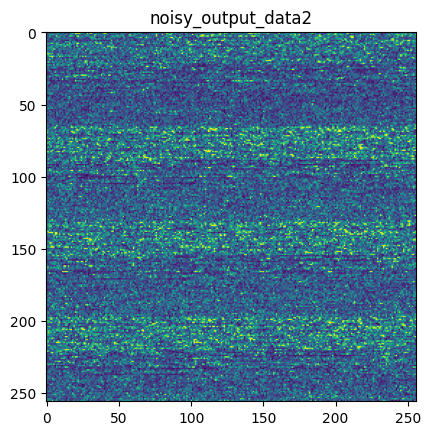

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_reshaped_output_again_data2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_reshaped_output_again_data2.png'
img = mpimg.imread(image_path)

title = "noisy_output_data2"
plt.imshow(img)
plt.title(title)
plt.axis('on')


Shape of the array: (500, 500)
Content of the array: [[108.26736  108.925934 117.212166 ...  82.050995  80.4646    78.39694 ]
 [105.54544  111.25749  116.15348  ...  82.43564   82.436966  81.882545]
 [105.72375  114.29315  116.50016  ...  84.36552   83.680084  83.15337 ]
 ...
 [ 39.393616  37.951004  36.219925 ...  40.278286  40.13775   42.019016]
 [ 38.29299   37.24214   35.74695  ...  40.305992  42.686253  42.169174]
 [ 42.087475  36.964798  34.9819   ...  40.442177  41.56603   43.05616 ]]


(-0.5, 499.5, 499.5, -0.5)

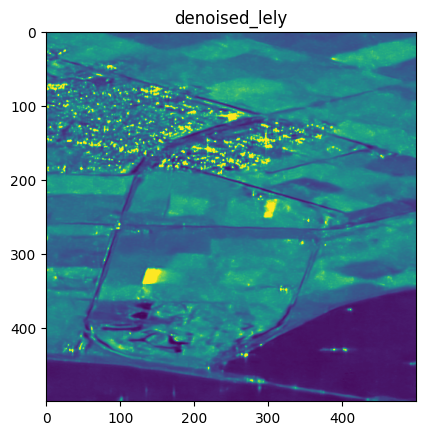

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_lely.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_lely.png'
img = mpimg.imread(image_path)

title = "denoised_lely"
plt.imshow(img)
plt.title(title)
plt.axis('on')


**denoised_lely_1**

Shape of the array: (256, 256)
Content of the array: [[108.26736  108.925934 117.212166 ... 102.738594 103.46137  107.3178  ]
 [105.54544  111.25749  116.15348  ... 103.222855 104.25394  105.897415]
 [105.72375  114.29315  116.50016  ... 100.96797  103.27081  104.92971 ]
 ...
 [ 83.824814  88.30796   89.08624  ... 129.49542  129.0682   129.85245 ]
 [ 84.11639   88.46642   90.36462  ... 133.3816   130.30101  128.42079 ]
 [ 85.798096  86.152466  88.023254 ... 133.13925  132.7889   120.7827  ]]


(-0.5, 255.5, 255.5, -0.5)

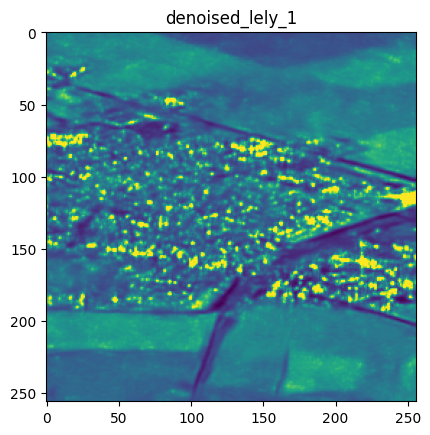

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_lely_1.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_lely_1.png'
img = mpimg.imread(image_path)

title = "denoised_lely_1"
plt.imshow(img)
plt.title(title)
plt.axis('on')


**denoised_lely_2**

Shape of the array: (256, 256)
Content of the array: [[114.16809  120.3631   124.480156 ... 115.06649  112.03166  114.841965]
 [117.30464  121.67011  122.69001  ... 105.74039  105.98612  106.25968 ]
 [119.673035 121.99404  124.76456  ...  92.447495  94.86012   95.323074]
 ...
 [ 76.61098   76.429924  76.317024 ... 140.14513  131.77098  121.43154 ]
 [ 77.54502   76.60995   77.23541  ... 153.71878  137.3459   118.38488 ]
 [ 78.46628   77.53068   80.38047  ... 139.91061  134.92299  115.30651 ]]


(-0.5, 255.5, 255.5, -0.5)

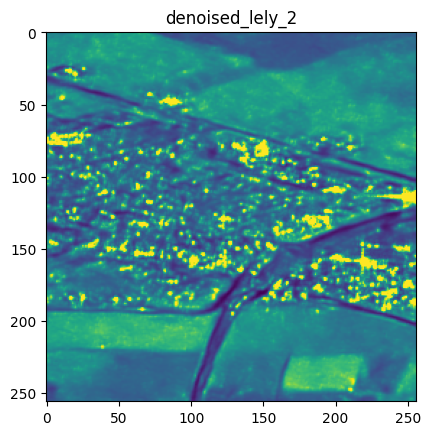

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_lely_2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_lely_2.png'
img = mpimg.imread(image_path)

title = "denoised_lely_2"
plt.imshow(img)
plt.title(title)
plt.axis('on')


**denosied_lely_3**

Shape of the array: (256, 256)
Content of the array: [[129.7445   138.71635  149.92549  ... 121.61211  122.415825 112.2418  ]
 [137.93265  142.74225  153.57445  ... 109.04848  111.75176  107.71349 ]
 [155.03673  158.0329   157.84808  ...  97.58453  103.409096 105.93993 ]
 ...
 [ 66.92498   66.04486   65.03929  ... 120.65559  118.89052  118.499756]
 [ 66.580826  66.46474   67.373314 ... 120.597275 116.56516  118.19941 ]
 [ 64.29879   66.495995  69.90033  ... 116.209206 117.13573  126.26221 ]]


(-0.5, 255.5, 255.5, -0.5)

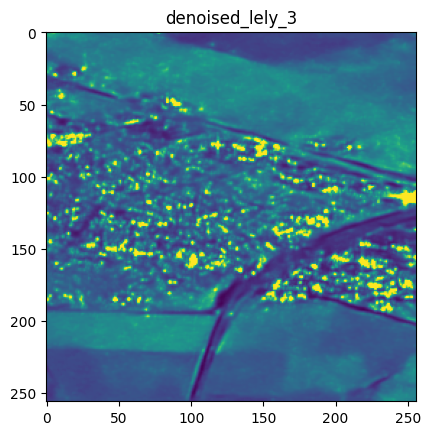

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_lely_3.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_lely_3.png'
img = mpimg.imread(image_path)

title = "denoised_lely_3"
plt.imshow(img)
plt.title(title)
plt.axis('on')


denosied_lely_4

Shape of the array: (256, 256)
Content of the array: [[127.669075 123.55668  125.89814  ... 162.42241  159.00526  158.15744 ]
 [132.82144  133.12668  137.33253  ... 165.88087  164.29108  164.27574 ]
 [130.68605  140.68222  136.49037  ... 159.96332  164.3699   158.97055 ]
 ...
 [ 83.69325   83.65878   82.472595 ... 166.12183  167.08945  160.39195 ]
 [ 84.17192   80.216515  79.43219  ... 160.5534   166.56935  168.01527 ]
 [ 85.86923   77.292885  80.27796  ... 159.68042  160.70415  163.22816 ]]


(-0.5, 255.5, 255.5, -0.5)

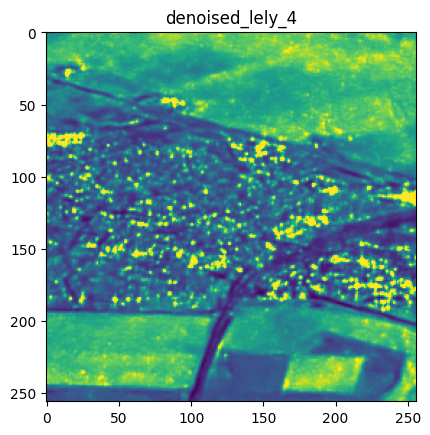

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_lely_4.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_lely_4.png'
img = mpimg.imread(image_path)

title = "denoised_lely_4"
plt.imshow(img)
plt.title(title)
plt.axis('on')


**denoised_lely_5**

Shape of the array: (256, 256)
Content of the array: [[ 94.09813   89.358444  92.671974 ... 116.84353  120.119774 118.48518 ]
 [102.096886 103.28185  106.556    ... 121.96276  120.68126  119.45183 ]
 [111.24816  120.33958  115.07778  ... 120.197815 119.43395  114.12716 ]
 ...
 [ 61.59388   61.617676  63.003872 ... 137.03777  136.87386  136.21599 ]
 [ 63.788624  65.151596  65.26596  ... 135.90756  144.05536  138.15248 ]
 [ 67.16686   64.656784  63.5994   ... 135.85844  140.98927  128.63727 ]]


(-0.5, 255.5, 255.5, -0.5)

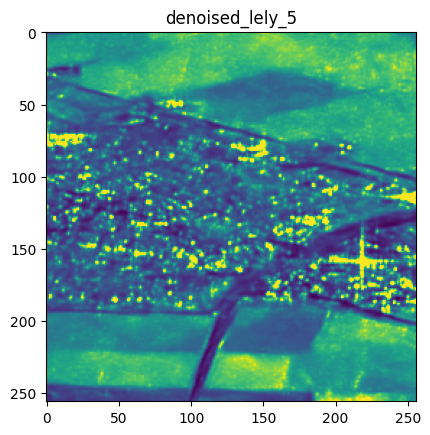

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_lely_5.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_lely_5.png'
img = mpimg.imread(image_path)

title = "denoised_lely_5"
plt.imshow(img)
plt.title(title)
plt.axis('on')


denosied_limange_1

Shape of the array: (256, 256)
Content of the array: [[ 96.45554  101.26817  108.368805 ...  62.834656  63.553448  66.83116 ]
 [ 83.514015  91.23313   96.515816 ...  67.91144   70.62043   72.31886 ]
 [ 71.98349   75.446396  78.48005  ...  81.49233   83.357414  82.56956 ]
 ...
 [ 66.80446   69.46989   71.931404 ...  80.71292   79.160095  76.794655]
 [ 65.0893    64.86189   64.28211  ...  81.57141   81.622765  80.178276]
 [ 64.320564  60.89133   61.73208  ...  80.929054  82.27008   83.97131 ]]


(-0.5, 255.5, 255.5, -0.5)

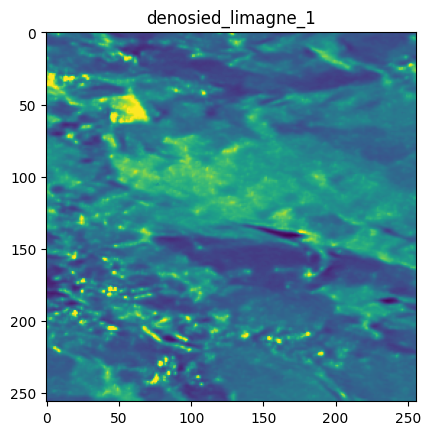

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_limagne_1.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_limagne_1.png'
img = mpimg.imread(image_path)

title = "denosied_limagne_1"
plt.imshow(img)
plt.title(title)
plt.axis('on')


**denosied_limange_2**

Shape of the array: (256, 256)
Content of the array: [[81.218216 84.2413   85.42098  ... 60.479557 61.986633 56.260895]
 [76.375275 80.79587  81.80871  ... 61.869045 64.96794  63.53187 ]
 [68.47717  72.182434 73.914566 ... 65.83816  68.769714 68.69591 ]
 ...
 [70.26994  68.66421  68.25348  ... 75.71431  74.15051  72.49827 ]
 [71.860374 68.465164 69.12993  ... 81.0347   79.60836  77.56617 ]
 [74.56472  69.83456  65.476425 ... 82.08512  77.68596  82.49699 ]]


(-0.5, 255.5, 255.5, -0.5)

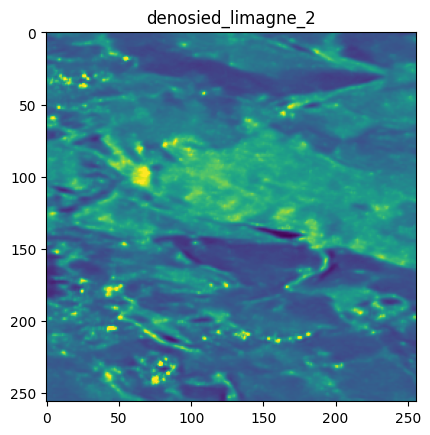

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_limagne_2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_limagne_2.png'
img = mpimg.imread(image_path)

title = "denosied_limagne_2"
plt.imshow(img)
plt.title(title)
plt.axis('on')


**denosied_limange_3**

Shape of the array: (256, 256)
Content of the array: [[70.565155 71.76914  74.28847  ... 57.0419   59.99883  63.68923 ]
 [71.25568  69.96749  70.55533  ... 58.58364  61.632545 64.731255]
 [65.60506  67.04699  66.54921  ... 59.229794 62.996418 63.959732]
 ...
 [67.421326 68.41308  73.48533  ... 67.18858  66.39106  68.681305]
 [68.93104  67.950966 65.04903  ... 68.76807  68.83967  71.67325 ]
 [71.33564  67.30697  68.44147  ... 71.99928  70.468315 76.018265]]


(-0.5, 255.5, 255.5, -0.5)

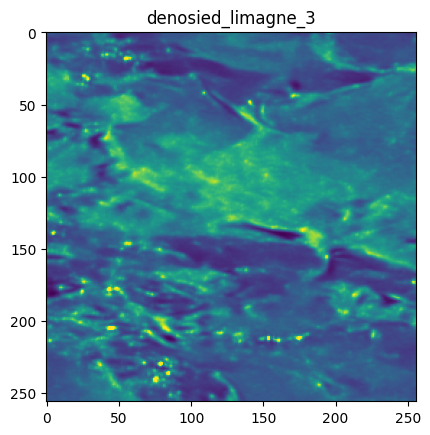

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_limagne_3.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_limagne_3.png'
img = mpimg.imread(image_path)

title = "denosied_limagne_3"
plt.imshow(img)
plt.title(title)
plt.axis('on')


**denosied_limange_4**

Shape of the array: (256, 256)
Content of the array: [[78.64894  79.7713   82.682076 ... 75.10698  79.414085 87.523026]
 [80.24291  83.24525  85.733315 ... 76.852974 86.21468  90.46413 ]
 [77.17503  84.57698  86.385956 ... 79.347694 90.8104   93.71858 ]
 ...
 [73.67359  72.98776  72.2744   ... 71.1165   71.258255 71.48409 ]
 [73.15501  73.89518  73.7892   ... 70.46542  71.99544  71.069176]
 [71.89574  75.27219  74.98932  ... 70.83877  68.66597  70.7307  ]]


(-0.5, 255.5, 255.5, -0.5)

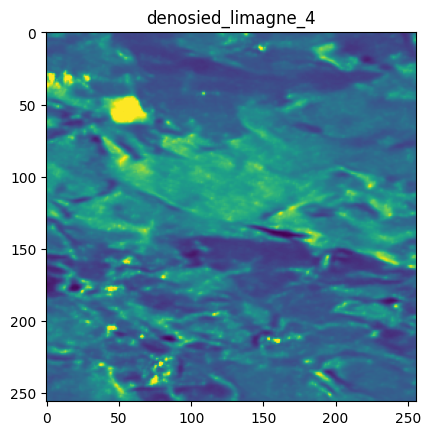

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_limagne_4.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_limagne_4.png'
img = mpimg.imread(image_path)

title = "denosied_limagne_4"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denosied_limange_5**

Shape of the array: (256, 256)
Content of the array: [[65.74116  65.23871  65.26478  ... 68.287865 69.18664  69.74398 ]
 [63.71554  63.551266 64.079155 ... 67.62346  69.369255 69.32158 ]
 [61.487534 65.254814 66.47551  ... 66.80248  67.341125 66.7835  ]
 ...
 [71.68255  71.377014 71.81174  ... 70.73609  70.65741  71.96386 ]
 [70.54793  68.84274  69.595474 ... 73.01853  73.385185 73.277405]
 [70.23644  66.77172  68.114395 ... 71.96242  71.021614 77.68521 ]]


(-0.5, 255.5, 255.5, -0.5)

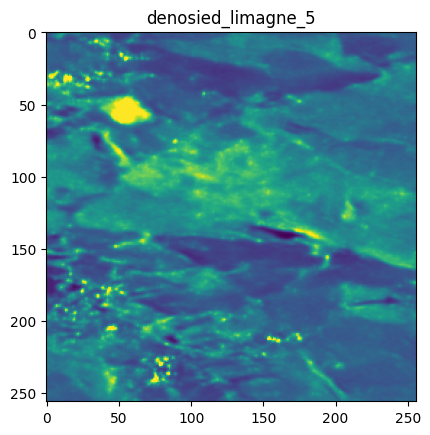

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_limagne_5.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_limagne_5.png'
img = mpimg.imread(image_path)

title = "denosied_limagne_5"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denosied_marais1**

Shape of the array: (500, 500)
Content of the array: [[103.623116 103.81233  106.92725  ...  74.80753   75.35536   73.9745  ]
 [102.594574 109.322014 110.31654  ...  74.84978   74.85362   75.7232  ]
 [107.41724  116.26219  118.12066  ...  74.58471   72.241455  73.3325  ]
 ...
 [145.72314  104.30316   78.12564  ...  60.523643  60.78272   59.56536 ]
 [156.10228  115.75935   81.8034   ...  63.217472  63.97413   60.670425]
 [121.85255  107.805664  82.548996 ...  63.482086  62.772484  65.09899 ]]


(-0.5, 499.5, 499.5, -0.5)

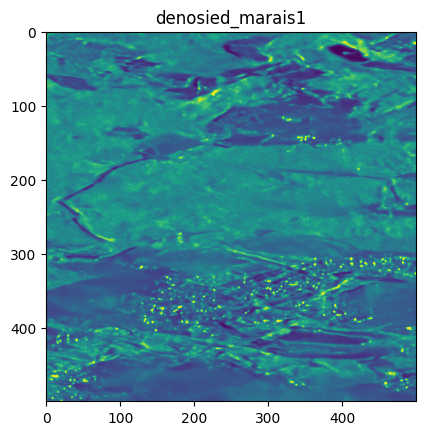

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_marais1.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_marais1.png'
img = mpimg.imread(image_path)

title = "denosied_marais1"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denoised_marais1_1**

Shape of the array: (256, 256)
Content of the array: [[103.623116 103.81233  106.92725  ... 104.8237   107.49225  107.14968 ]
 [102.594574 109.322014 110.31654  ... 109.58453  109.13482  105.32574 ]
 [107.41724  116.26219  118.12066  ... 110.02424  106.07713   98.0088  ]
 ...
 [ 87.748344  90.11084   90.41548  ... 106.72512  104.48356  107.83076 ]
 [ 90.988625  90.14385   92.524315 ... 101.63388  104.54247  110.17251 ]
 [ 86.71926   89.41402   94.2349   ...  99.75968  102.74888  106.546646]]


(-0.5, 255.5, 255.5, -0.5)

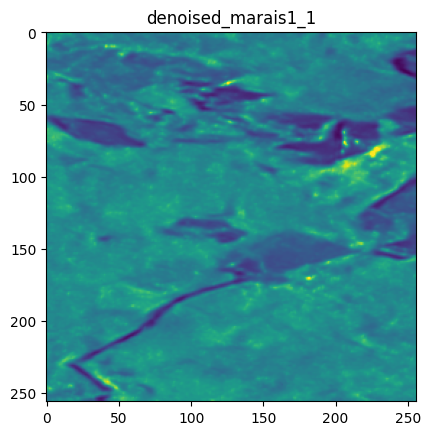

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_marais1_1.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_marais1_1.png'
img = mpimg.imread(image_path)

title = "denoised_marais1_1"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denoised_marais1_2**

Shape of the array: (256, 256)
Content of the array: [[ 89.26151   87.81741   90.78165  ...  86.33243   87.10435   86.894196]
 [ 92.95203   90.18787   90.74624  ...  89.69501   89.32905   86.47696 ]
 [ 97.55745   96.28074   96.86363  ...  91.199814  86.60942   83.374916]
 ...
 [ 85.75408   88.320335  88.1069   ... 101.85491   96.88136   96.79548 ]
 [ 88.16338   86.67825   87.14598  ... 100.032814  98.354675 102.3564  ]
 [ 85.98371   88.06541   89.782394 ...  98.10306   99.663635 102.36509 ]]


(-0.5, 255.5, 255.5, -0.5)

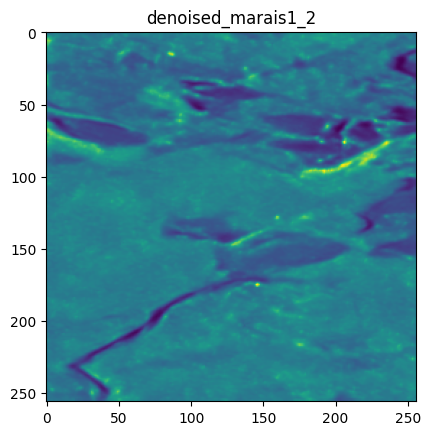

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_marais1_2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_marais1_2.png'
img = mpimg.imread(image_path)

title = "denoised_marais1_2"
plt.imshow(img)
plt.title(title)
plt.axis('on')


denoised_marais1_3

Shape of the array: (256, 256)
Content of the array: [[110.959    104.829796 104.01172  ...  93.581764  95.28108   92.124664]
 [114.42272  112.0759   108.00778  ... 103.40347  101.7004    92.95193 ]
 [113.02001  113.060104 107.649414 ... 101.127556  99.06938   88.90649 ]
 ...
 [ 88.66      87.82562   86.34683  ...  88.62983   89.58225   89.03664 ]
 [ 87.5884    86.8304    87.58097  ...  85.67356   89.40482   89.1233  ]
 [ 85.70854   86.44545   87.05768  ...  83.485664  84.83718   83.08203 ]]


(-0.5, 255.5, 255.5, -0.5)

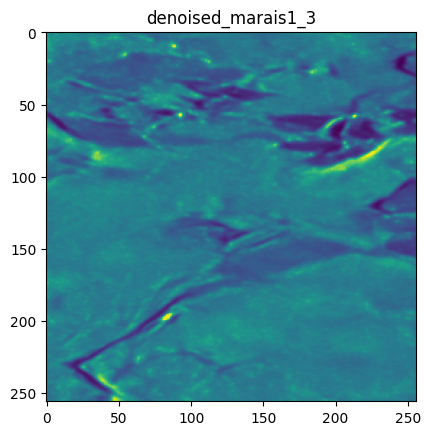

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_marais1_3.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_marais1_3.png'
img = mpimg.imread(image_path)

title = "denoised_marais1_3"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denoised_marais1_4**

Shape of the array: (256, 256)
Content of the array: [[ 92.745964  97.4311   100.30556  ...  96.47652   99.169106  98.66207 ]
 [100.07232  102.21506  103.04425  ...  98.99561  101.69332   99.607475]
 [100.95593  105.015015 102.50235  ...  94.22852   96.4114    92.89628 ]
 ...
 [102.7382   108.510994 110.55393  ... 108.909    105.340904 101.256   ]
 [103.10726  101.30854  110.00326  ... 106.16497  103.052704  97.98758 ]
 [101.06777   94.33525   99.887344 ... 104.15992  100.21223   97.48221 ]]


(-0.5, 255.5, 255.5, -0.5)

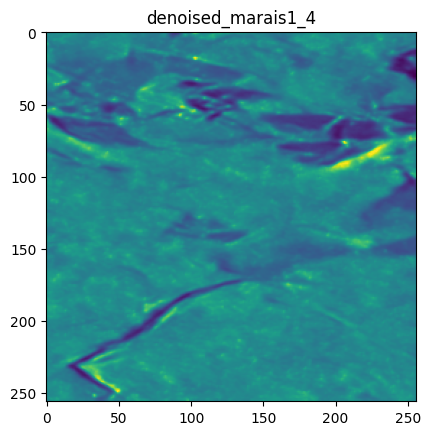

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_marais1_4.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_marais1_4.png'
img = mpimg.imread(image_path)

title = "denoised_marais1_4"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denoised_marais1_5**

Shape of the array: (256, 256)
Content of the array: [[ 95.35244  102.448006 104.37261  ...  97.606766  99.26524   99.96234 ]
 [100.736465 105.60011  110.36042  ...  97.334785  97.931335  96.587814]
 [100.88856  103.31564  109.44427  ...  95.932365  94.83335   93.5103  ]
 ...
 [132.45525  128.64684  113.72884  ... 101.259476 108.19697  118.22107 ]
 [115.45022  111.61756  101.687195 ...  94.32185   97.18063  107.36664 ]
 [ 92.941734  96.07913   89.5013   ...  92.94989   96.47845  102.93886 ]]


(-0.5, 255.5, 255.5, -0.5)

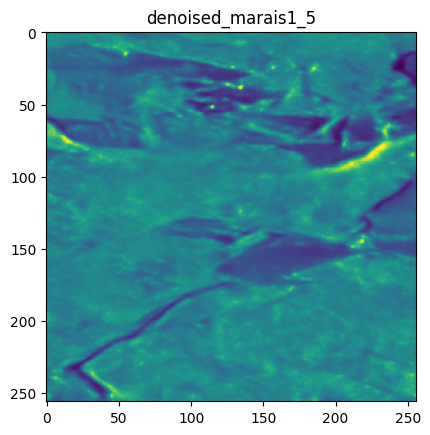

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_marais1_5.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_marais1_5.png'
img = mpimg.imread(image_path)

title = "denoised_marais1_5"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denoised_marais2_1**

Shape of the array: (256, 256)
Content of the array: [[ 79.80394   82.39398   83.73548  ...  94.739876  94.16007   95.48247 ]
 [ 80.25018   82.861496  84.36334  ...  97.30054  100.00535  100.038445]
 [ 82.168304  84.1139    82.993576 ...  94.39888   98.44438   98.327385]
 ...
 [142.47922  153.02489  136.14236  ...  66.12497   66.91247   66.51806 ]
 [131.90903  135.49911  133.65894  ...  72.03514   73.75634   69.69331 ]
 [120.16973  126.67349  131.08836  ...  75.84476   72.83319   75.26953 ]]


(-0.5, 255.5, 255.5, -0.5)

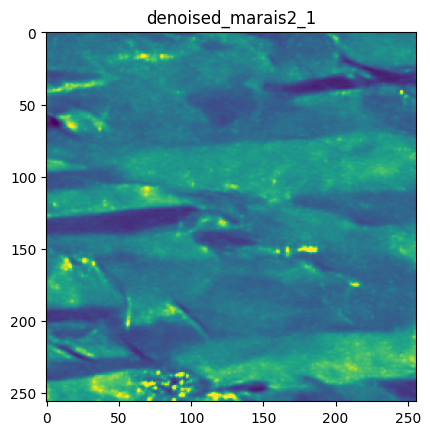

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_marais2_1.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_marais2_1.png'
img = mpimg.imread(image_path)

title = "denoised_marais2_1"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denoised_marais2_2**

Shape of the array: (256, 256)
Content of the array: [[79.170586 84.10596  85.957054 ... 86.64874  88.13775  80.162674]
 [85.01917  89.56764  88.38901  ... 90.16611  92.481094 89.28647 ]
 [83.75241  88.48136  86.58935  ... 87.95302  81.57685  90.52721 ]
 ...
 [88.87978  88.38328  85.95862  ... 67.66946  67.75256  67.59889 ]
 [84.39489  84.023544 85.16053  ... 66.367386 69.16619  66.35162 ]
 [81.75178  78.745155 81.86029  ... 65.820015 63.968456 67.55468 ]]


(-0.5, 255.5, 255.5, -0.5)

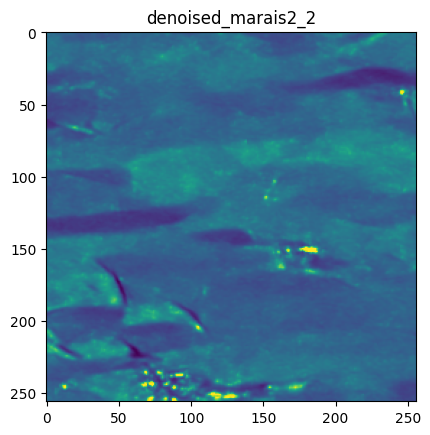

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_marais2_2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_marais2_2.png'
img = mpimg.imread(image_path)

title = "denoised_marais2_2"
plt.imshow(img)
plt.title(title)
plt.axis('on')


denoised_marais2_3

Shape of the array: (256, 256)
Content of the array: [[ 67.108086  69.123924  70.77084  ...  87.17939   88.244225  82.931305]
 [ 71.368164  72.16316   72.24752  ...  85.61574   88.13388   86.240585]
 [ 71.84756   75.69208   75.33108  ...  81.00766   82.7732    83.23636 ]
 ...
 [109.73639  113.85593  115.157814 ...  63.871834  63.30972   65.40553 ]
 [102.35563  104.8965   108.32705  ...  63.868     64.174866  64.80087 ]
 [ 95.4548    99.7067   105.90004  ...  62.598103  64.154     64.35867 ]]


(-0.5, 255.5, 255.5, -0.5)

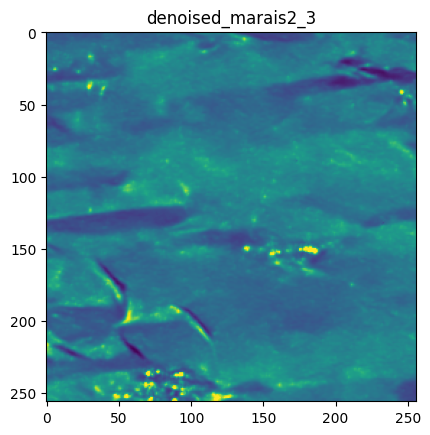

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_marais2_3.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_marais2_3.png'
img = mpimg.imread(image_path)

title = "denoised_marais2_3"
plt.imshow(img)
plt.title(title)
plt.axis('on')


denoised_marais2_4

Shape of the array: (256, 256)
Content of the array: [[112.127426  93.46082   92.460625 ... 108.08084  107.05449  104.839096]
 [102.67052   92.16843   90.849976 ... 116.9113   112.20295  107.847015]
 [ 96.203     96.2509    95.42986  ... 115.23692  110.40158  106.06064 ]
 ...
 [126.103134 131.92375  132.52737  ...  82.73871   84.62183   86.7972  ]
 [125.508766 127.28685  129.86769  ...  89.522644  92.281105  90.30794 ]
 [126.75167  130.10309  132.2635   ...  86.58035   87.13575   92.1869  ]]


(-0.5, 255.5, 255.5, -0.5)

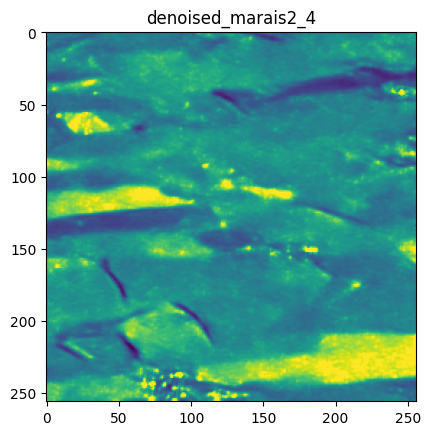

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_marais2_4.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_marais2_4.png'
img = mpimg.imread(image_path)

title = "denoised_marais2_4"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denoised_marais2_5**

Shape of the array: (256, 256)
Content of the array: [[59.97389  62.601627 63.608444 ... 83.12015  83.85927  85.7213  ]
 [61.16884  64.01074  65.03427  ... 84.92793  83.78413  85.853836]
 [62.527515 65.30382  64.68633  ... 85.93173  88.11758  91.78301 ]
 ...
 [74.54581  75.97072  76.02957  ... 61.228138 62.69704  63.26132 ]
 [73.01018  72.54938  73.1377   ... 60.728775 62.21815  63.02574 ]
 [76.45537  73.19807  73.683716 ... 62.025547 62.05815  66.17241 ]]


(-0.5, 255.5, 255.5, -0.5)

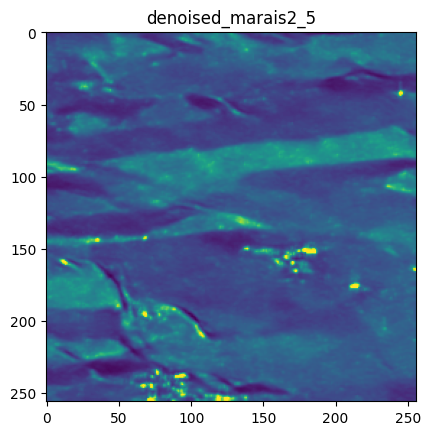

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_marais2_5.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_marais2_5.png'
img = mpimg.imread(image_path)

title = "denoised_marais2_5"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denoised_ramb_1**

Shape of the array: (256, 256)
Content of the array: [[101.965324 109.539604 115.869026 ... 101.04512  102.998474 104.95984 ]
 [103.489395 110.879555 118.581955 ...  97.00304   98.78191  106.06742 ]
 [111.049934 115.79137  120.61729  ...  98.789734 105.61602  114.42283 ]
 ...
 [183.23503  187.5449   184.75812  ...  60.92757   60.694206  63.273262]
 [187.2511   185.08403  182.38737  ...  66.07794   64.9926    61.934048]
 [186.49617  196.14204  194.72556  ...  72.33052   69.79941   68.840385]]


(-0.5, 255.5, 255.5, -0.5)

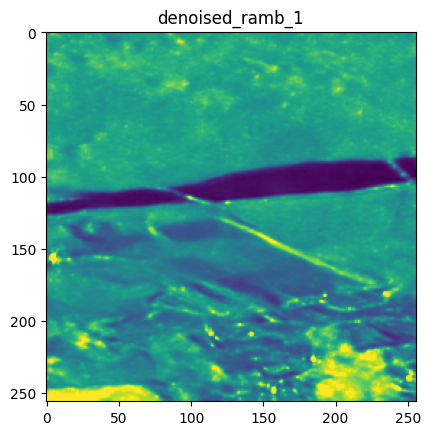

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_ramb_1.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_ramb_1.png'
img = mpimg.imread(image_path)

title = "denoised_ramb_1"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denoised_ramb_2**

Shape of the array: (256, 256)
Content of the array: [[ 97.06171   99.366585 104.64071  ...  91.897575  93.13108   90.78432 ]
 [103.24787  103.06813  104.37181  ...  88.686646  90.81187   92.47923 ]
 [106.35488  105.423615 103.2211   ...  87.30203   92.14277   94.42561 ]
 ...
 [124.1012   126.95759  126.34038  ...  70.77233   71.27389   74.78271 ]
 [128.503    123.43419  127.137985 ...  68.37701   68.19194   72.05465 ]
 [122.72219  125.682915 133.28395  ...  76.44356   73.89899   74.12188 ]]


(-0.5, 255.5, 255.5, -0.5)

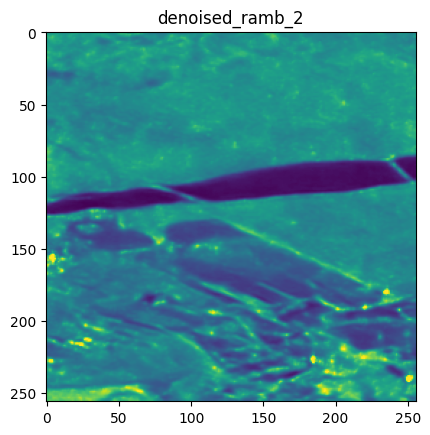

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_ramb_2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_ramb_2.png'
img = mpimg.imread(image_path)

title = "denoised_ramb_2"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denoised_ramb_3**

Shape of the array: (256, 256)
Content of the array: [[107.39398  104.548454 102.07167  ...  94.70718   94.10746   97.80776 ]
 [102.43629  100.353195 103.330025 ...  96.85559   98.818855  98.19132 ]
 [106.19008  105.53094  104.96975  ...  94.991936  97.83491   97.16997 ]
 ...
 [164.86821  166.69109  171.3866   ...  78.364876  77.12743   78.60815 ]
 [166.4979   165.51253  171.02202  ...  81.02179   79.33575   81.42824 ]
 [167.98676  166.62321  173.94765  ...  90.17075   85.21025   88.92141 ]]


(-0.5, 255.5, 255.5, -0.5)

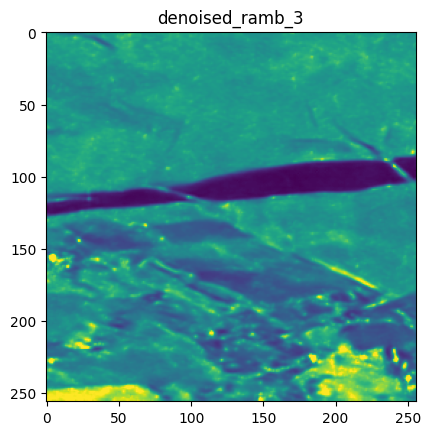

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_ramb_3.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_ramb_3.png'
img = mpimg.imread(image_path)

title = "denoised_ramb_3"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denoised_ramb_4**

Shape of the array: (256, 256)
Content of the array: [[ 98.82893   96.97991   99.291275 ...  91.39179   86.39181   94.16385 ]
 [ 94.8319    99.1743   100.11957  ...  95.73907   92.35118  105.33557 ]
 [ 92.7251    96.69141   96.71309  ...  95.69689   94.59832   98.4919  ]
 ...
 [167.93822  170.12018  173.24965  ...  62.099113  63.12211   64.27114 ]
 [164.68875  164.0927   169.65195  ...  63.27193   63.64661   61.36949 ]
 [164.06969  163.89516  171.28595  ...  59.09061   61.35065   61.124462]]


(-0.5, 255.5, 255.5, -0.5)

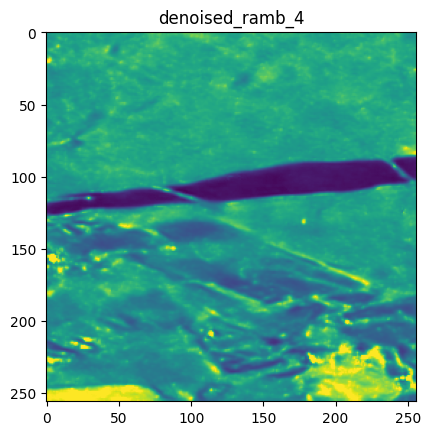

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_ramb_4.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_ramb_4.png'
img = mpimg.imread(image_path)

title = "denoised_ramb_4"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **denoised_ramb_5**

Shape of the array: (256, 256)
Content of the array: [[115.67581  102.661514 100.7234   ...  95.9589    94.790306  93.528404]
 [103.45328  100.044266  98.07639  ...  95.2601    94.23751   92.00947 ]
 [ 98.327576  98.13431   96.003845 ...  89.11148   88.6016    87.51117 ]
 ...
 [138.25754  139.29779  137.9654   ...  53.4551    52.102478  58.136227]
 [129.38974  125.947845 129.57709  ...  63.117893  59.76378   59.80312 ]
 [123.33099  123.41183  127.45593  ...  79.53603   73.81784   69.31371 ]]


(-0.5, 255.5, 255.5, -0.5)

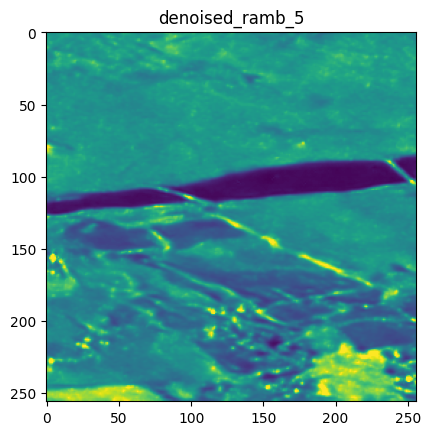

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/denoised_ramb_5.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/denoised_ramb_5.png'
img = mpimg.imread(image_path)

title = "denoised_ramb_5"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_lely_1**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_lely_1.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_lely_1.png'
img = mpimg.imread(image_path)

title = "noisy_lely_1"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_lely_2**

Shape of the array: (256, 256)
Content of the array: [[ 92.71538  147.71689  164.69518  ... 171.07323  115.38549  174.60547 ]
 [117.72681   63.030006  52.8757   ...  95.090454  48.37835   97.07272 ]
 [154.25862   30.076853 114.12933  ...  81.27974  111.50776   86.319496]
 ...
 [ 41.345776  14.613066  26.755627 ... 206.37477  128.83824   55.395153]
 [ 35.95842   80.170166  27.785973 ... 271.7424   109.12494   19.318592]
 [ 87.61405   74.60846  103.61857  ... 171.10635  134.30498   48.57548 ]]


(-0.5, 255.5, 255.5, -0.5)

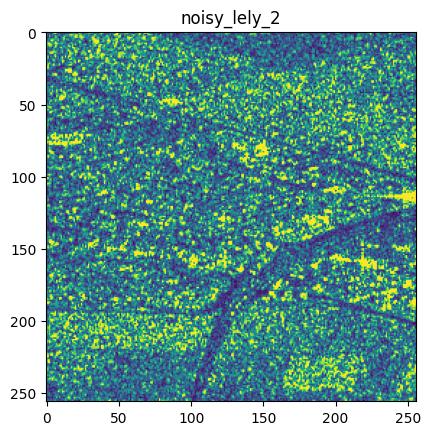

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_lely_2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_lely_2.png'
img = mpimg.imread(image_path)

title = "noisy_lely_2"
plt.imshow(img)
plt.title(title)
plt.axis('on')


### **noisy_lely_3**

Shape of the array: (256, 256)
Content of the array: [[120.65605   75.1375   131.5343   ... 277.47836  216.08612   46.744144]
 [ 55.967533  43.94994  114.29119  ... 140.4116    60.891563  73.88039 ]
 [258.1688    90.38435  188.09659  ...  68.01294  139.3055   173.19084 ]
 ...
 [ 48.349564  61.539333  12.684663 ...  82.348656  96.94209   86.08102 ]
 [ 47.874725  73.24346   95.31608  ... 101.85716   47.00295   40.884335]
 [ 24.994167  81.21249   84.648224 ...  47.59194   83.79572  194.51044 ]]


(-0.5, 255.5, 255.5, -0.5)

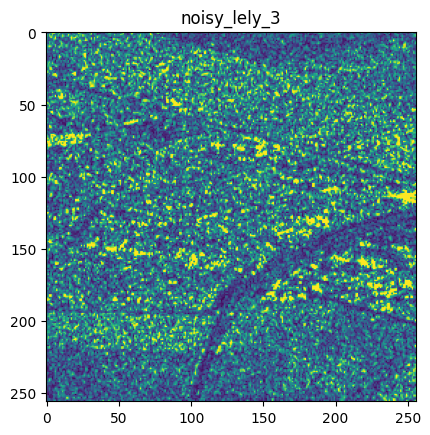

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_lely_3.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_lely_3.png'
img = mpimg.imread(image_path)

title = "noisy_lely_3"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_lely_4**

Shape of the array: (256, 256)
Content of the array: [[ 84.43948   56.46262  105.19755  ... 190.27734   61.4096    92.82729 ]
 [149.73288  115.554634 173.1887   ... 111.38574  203.29482  156.36554 ]
 [ 87.35516  221.01794   85.27358  ...  45.240723 232.06525  197.99228 ]
 ...
 [ 39.94748   56.41714   25.845375 ... 227.72893  289.39053   63.14143 ]
 [ 84.56157   55.559586  11.585791 ... 130.90721  206.73367  105.404015]
 [ 85.281715  58.74931   75.7466   ... 157.65794  176.97241  251.65738 ]]


(-0.5, 255.5, 255.5, -0.5)

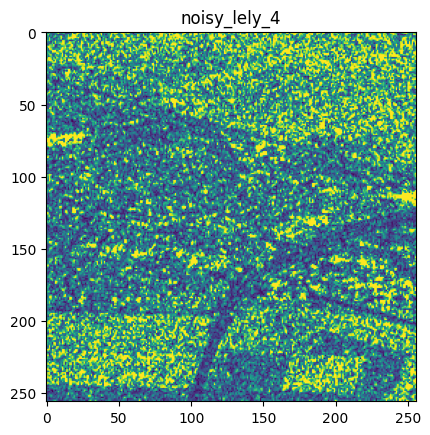

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_lely_4.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_lely_4.png'
img = mpimg.imread(image_path)

title = "noisy_lely_4"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_lely_5**

Shape of the array: (256, 256)
Content of the array: [[ 26.664627  38.83543  106.81992  ... 127.62002  139.00385   35.238182]
 [ 66.800835  55.590908 110.87417  ...  75.679085 112.14058   98.8872  ]
 [142.67719  117.13451  121.33744  ...  59.782475  52.51558   44.521667]
 ...
 [ 26.13981   36.519268  53.818916 ...  80.24796  165.99307  132.49036 ]
 [ 34.753822  67.61533   60.608143 ... 100.01918   96.593994  83.55927 ]
 [ 69.67663   50.36274   49.46986  ... 116.27739  133.40004   23.732288]]


(-0.5, 255.5, 255.5, -0.5)

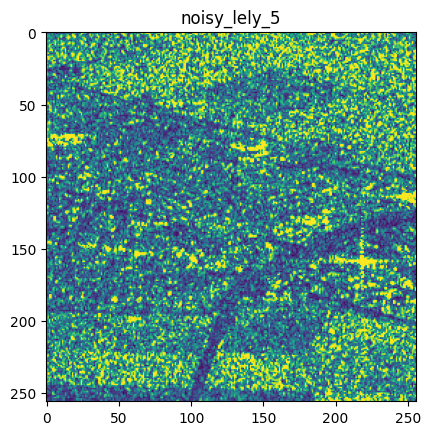

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_lely_5.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_lely_5.png'
img = mpimg.imread(image_path)

title = "noisy_lely_5"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_limagne_1**

Shape of the array: (256, 256)
Content of the array: [[ 86.353836 132.59337   91.48223  ...  22.022718  18.02775   57.99994 ]
 [ 50.695168  76.14698  106.47057  ...  61.983852  59.03383   39.408066]
 [ 27.78486   78.26233   36.079834 ...  80.873726  98.37175   35.871048]
 ...
 [ 33.999973  36.578598 125.60252  ...  68.997665  63.56096    4.178743]
 [ 40.60788   41.999966  12.960695 ...  29.206139  55.865887  48.301083]
 [ 17.18618   19.999958  48.507774 ...  11.99998  113.84193  127.58119 ]]


(-0.5, 255.5, 255.5, -0.5)

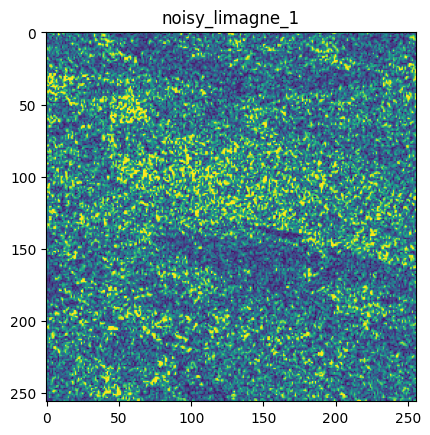

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_limagne_1.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_limagne_1.png'
img = mpimg.imread(image_path)

title = "noisy_limagne_1"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_limagne_2**

Shape of the array: (256, 256)
Content of the array: [[ 53.566986  95.90373  115.53172  ...  38.119114  83.813705   8.136054]
 [ 49.686287  80.84412   68.96471  ...  52.886166  60.77014   63.09231 ]
 [ 32.884716  42.618305  51.2016   ...  73.56758  106.98702   43.617294]
 ...
 [ 26.04494   29.61958   59.965366 ... 109.84916   53.042194  63.446564]
 [ 58.942303  50.322918  46.802517 ...  71.03103   44.512962 114.24694 ]
 [101.011406 122.04269    5.632137 ...  20.557817  82.23564  119.91295 ]]


(-0.5, 255.5, 255.5, -0.5)

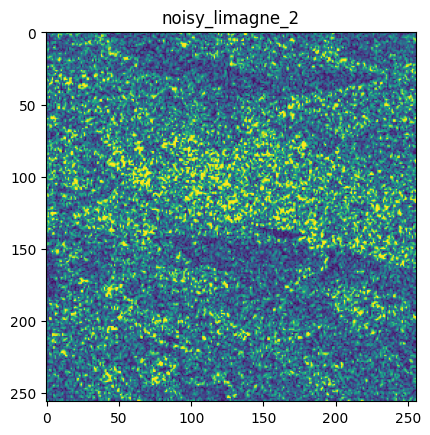

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_limagne_2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_limagne_2.png'
img = mpimg.imread(image_path)

title = "noisy_limagne_2"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_limagne_3**

Shape of the array: (256, 256)
Content of the array: [[ 53.566986  95.90373  115.53172  ...  38.119114  83.813705   8.136054]
 [ 49.686287  80.84412   68.96471  ...  52.886166  60.77014   63.09231 ]
 [ 32.884716  42.618305  51.2016   ...  73.56758  106.98702   43.617294]
 ...
 [ 26.04494   29.61958   59.965366 ... 109.84916   53.042194  63.446564]
 [ 58.942303  50.322918  46.802517 ...  71.03103   44.512962 114.24694 ]
 [101.011406 122.04269    5.632137 ...  20.557817  82.23564  119.91295 ]]


(-0.5, 255.5, 255.5, -0.5)

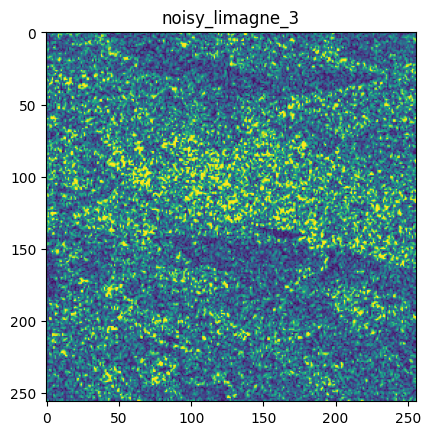

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_limagne_2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_limagne_2.png'
img = mpimg.imread(image_path)

title = "noisy_limagne_3"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_limagne_4**

Shape of the array: (256, 256)
Content of the array: [[ 29.860346  49.761806  67.83448  ...  83.50796   30.075018 115.93512 ]
 [ 76.51386   43.769203  81.38717  ...  50.229637  66.1572    94.74503 ]
 [ 45.955524  58.805645 100.84547  ...  67.32232   74.87148   17.46051 ]
 ...
 [ 22.204943  48.614197  62.511242 ...  14.239392  44.841484  48.885498]
 [ 52.75212   93.63157   53.15015  ...  55.359028  58.702095  58.978912]
 [ 38.14546  151.947    136.52838  ...  56.612297  51.256218  48.6423  ]]


(-0.5, 255.5, 255.5, -0.5)

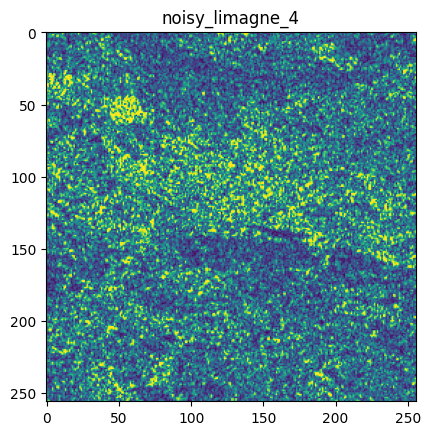

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_limagne_4.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_limagne_4.png'
img = mpimg.imread(image_path)

title = "noisy_limagne_4"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_limagne_5**

Shape of the array: (256, 256)
Content of the array: [[ 64.19672   53.50072   36.34541  ...  58.636074  39.564415  49.28254 ]
 [ 37.125225  23.501116  20.333977 ...  60.211952  45.848976  70.31627 ]
 [ 27.753967  84.676     54.747215 ...  51.999226   6.762826  49.833824]
 ...
 [ 50.074333  53.138897  87.20359  ...  68.96109   12.984742  72.02318 ]
 [ 37.23621   84.47025   29.14077  ... 117.11472   76.8735    60.689342]
 [ 51.106125  66.6792    55.14878  ...  31.327084  66.933975 112.530754]]


(-0.5, 255.5, 255.5, -0.5)

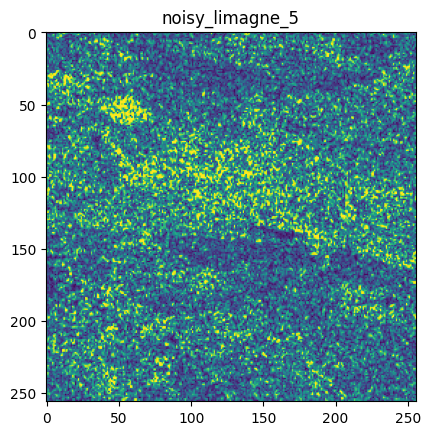

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_limagne_5.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_limagne_5.png'
img = mpimg.imread(image_path)

title = "noisy_limagne_5"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_marais1**

Shape of the array: (500, 500)
Content of the array: [[113.00793   103.40623    70.93855   ...  41.263866   83.437675
   52.191048 ]
 [ 29.667768   88.10657    86.37278   ...  67.626945    9.929591
   82.973946 ]
 [112.242004  189.36098   126.44211   ...  77.11037     3.9022372
   91.1121   ]
 ...
 [173.95395    77.88469    28.409939  ...  64.17632    53.219486
    8.031505 ]
 [225.85394   139.6592     51.062378  ...  29.049677   61.72325
   71.5581   ]
 [135.16292   124.91993    27.912739  ... 112.32981    35.253708
   78.798416 ]]


(-0.5, 499.5, 499.5, -0.5)

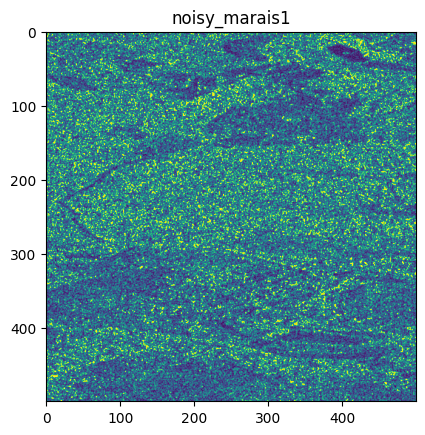

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_marais1.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_marais1.png'
img = mpimg.imread(image_path)

title = "noisy_marais1"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_marais1_1**

Shape of the array: (256, 256)
Content of the array: [[113.00793  103.40623   70.93855  ... 121.089134 119.013374  99.68959 ]
 [ 29.667768  88.10657   86.37278  ... 101.442924 125.57951   85.12603 ]
 [112.242004 189.36098  126.44211  ... 125.23651   50.242287  25.953262]
 ...
 [ 51.75942   69.16118  102.8067   ... 118.06772   43.278156  25.324123]
 [ 67.46339   73.47566   53.98089  ...  61.326954  74.750336 106.10607 ]
 [ 55.507103 104.66277   59.532486 ...  68.96372  113.93565  152.8589  ]]


(-0.5, 255.5, 255.5, -0.5)

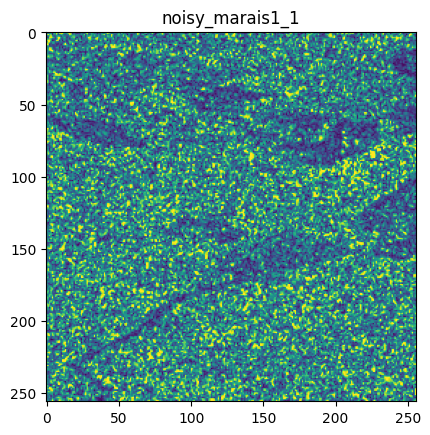

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_marais1_1.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_marais1_1.png'
img = mpimg.imread(image_path)

title = "noisy_marais1_1"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_marais1_2**

Shape of the array: (256, 256)
Content of the array: [[ 55.760925  75.29861   31.729158 ...  24.189611  31.459774  73.92965 ]
 [ 97.57978   31.389288   8.653963 ... 130.34251   55.976974  51.022655]
 [ 54.36319   16.001501  75.25518  ... 133.73633   31.976639  18.177547]
 ...
 [ 33.147923  57.182907  85.4363   ... 116.71222   18.519432  21.641514]
 [ 34.632973  55.586823  24.739258 ...  19.468178  27.749046 118.819664]
 [ 96.19061  111.970024 107.24516  ...  62.59446   74.29861  145.67827 ]]


(-0.5, 255.5, 255.5, -0.5)

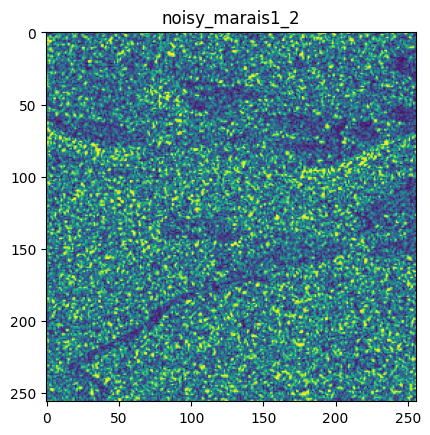

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_marais1_2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_marais1_2.png'
img = mpimg.imread(image_path)

title = "noisy_marais1_2"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_marais1_3**

Shape of the array: (256, 256)
Content of the array: [[ 67.38153   85.10849   66.48762  ...  52.128292 113.98509   94.56358 ]
 [169.93127  110.89035   78.75754  ... 212.84338  157.9529    29.861368]
 [164.06609  154.1395    50.483612 ... 168.42886  108.03107   10.313333]
 ...
 [124.46768   46.10357   44.11333  ...  79.57413   81.53026   24.964783]
 [ 63.27193   55.297188  79.618004 ...  17.742495  74.65623   94.02242 ]
 [ 90.08764   66.550865  56.910564 ...  33.12443   30.087484  69.94547 ]]


(-0.5, 255.5, 255.5, -0.5)

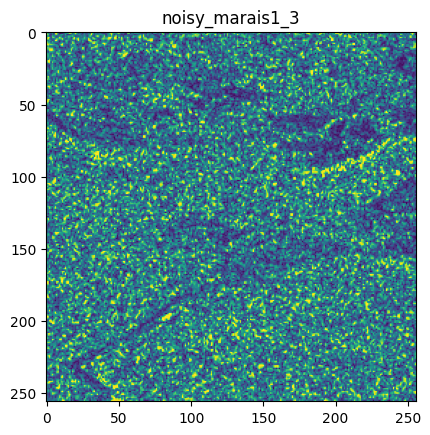

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_marais1_3.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_marais1_3.png'
img = mpimg.imread(image_path)

title = "noisy_marais1_3"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_marais1_4**

Shape of the array: (256, 256)
Content of the array: [[ 46.870277  22.16917   75.06731  ...  79.77579  102.41109   65.41128 ]
 [ 94.30566   87.633026  67.12313  ... 126.769806 157.01917  124.49084 ]
 [145.96085   88.013016 109.80422  ...  58.155136  24.735567  45.497906]
 ...
 [ 62.58921  136.83954  140.92554  ... 133.35007   88.987915  48.8611  ]
 [ 66.08399   72.99354  123.67551  ...  84.81202   25.256374  39.429455]
 [ 65.71766   63.74131   29.549679 ... 109.93739   68.78578   55.621082]]


(-0.5, 255.5, 255.5, -0.5)

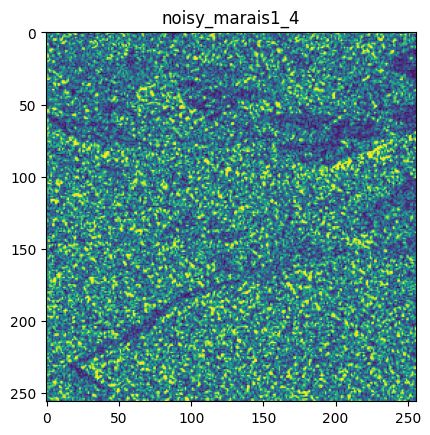

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_marais1_4.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_marais1_4.png'
img = mpimg.imread(image_path)

title = "noisy_marais1_4"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_marais1_5**

Shape of the array: (256, 256)
Content of the array: [[ 67.424545  81.04521   98.443825 ... 128.24847  109.66252  126.88375 ]
 [ 42.453163  71.82345  104.99568  ... 122.02721   90.50486   21.889183]
 [ 60.566254  20.84774  120.30618  ... 114.24433   30.074888  61.541035]
 ...
 [242.11972  121.629395 117.22199  ...  50.081524  97.55177  188.47348 ]
 [161.39575  101.49605   73.360405 ...  46.596912  52.819935  32.138813]
 [ 38.069252  15.324543  57.70444  ...  46.09416  113.18989  118.03001 ]]


(-0.5, 255.5, 255.5, -0.5)

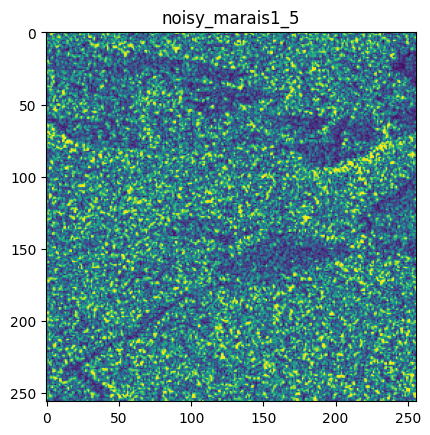

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_marais1_5.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_marais1_5.png'
img = mpimg.imread(image_path)

title = "noisy_marais1_5"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_marais2_1**

Shape of the array: (256, 256)
Content of the array: [[ 64.96918   63.16046   49.20195  ...  91.38945   88.557335  52.848427]
 [ 15.207333  63.356224  42.53342  ... 106.565346 151.1011   131.11186 ]
 [ 79.080795  58.425636  56.042355 ...  53.370132 110.472565 170.75165 ]
 ...
 [256.87723  279.29404   88.85428  ...  15.075352  34.95269   32.11614 ]
 [145.01306  216.40765   93.2299   ...  98.99099   94.033455  41.04204 ]
 [ 36.82244  144.42195   98.40957  ...  73.0271    88.93973   48.305344]]


(-0.5, 255.5, 255.5, -0.5)

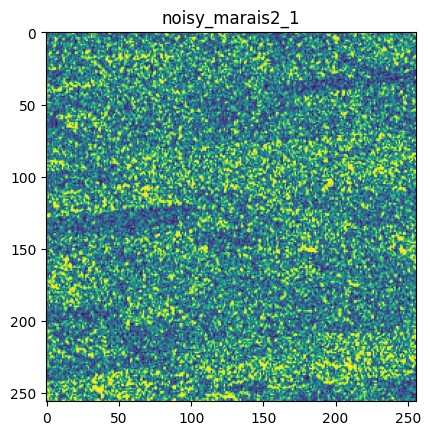

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_marais2_1.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_marais2_1.png'
img = mpimg.imread(image_path)

title = "noisy_marais2_1"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_marais2_2**

Shape of the array: (256, 256)
Content of the array: [[ 31.299595  73.208466  99.73961  ... 115.13443   60.878384   4.019118]
 [ 49.268818 123.64791  126.24789  ...  77.65477    6.981332  51.404034]
 [ 65.35216  138.01962  127.70354  ...  37.676613  41.070545  84.98392 ]
 ...
 [149.06808  123.12688   67.57671  ... 122.62439   85.81544   53.235245]
 [ 99.6146    82.455765  96.88996  ...  46.09759   89.06883   40.196148]
 [ 34.11692   43.554947  33.815445 ...  33.741386  81.50539   60.12295 ]]


(-0.5, 255.5, 255.5, -0.5)

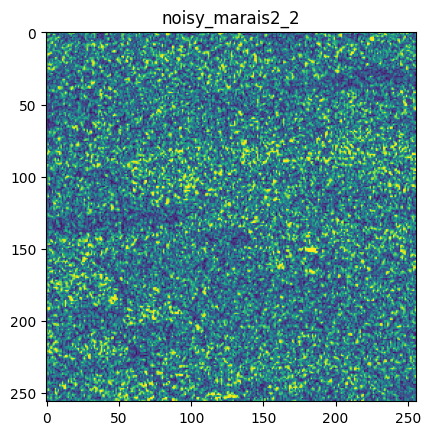

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_marais2_2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_marais2_2.png'
img = mpimg.imread(image_path)

title = "noisy_marais2_2"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_marais2_3**

Shape of the array: (256, 256)
Content of the array: [[ 56.346004  39.239452  16.432238 ... 126.60332  126.30641   17.888754]
 [ 47.070663  20.242786  52.63818  ... 112.70077  122.04548   98.604034]
 [ 49.94128  111.30716  118.979095 ...  85.23179   49.120636 110.073784]
 ...
 [151.09908  145.00739   49.608875 ...  49.21681   65.41869   70.29421 ]
 [ 79.35246   54.17483   82.84143  ...  41.72551   16.046856  51.384716]
 [ 18.52687   78.78707  124.875626 ...  45.082443  24.52521   53.331665]]


(-0.5, 255.5, 255.5, -0.5)

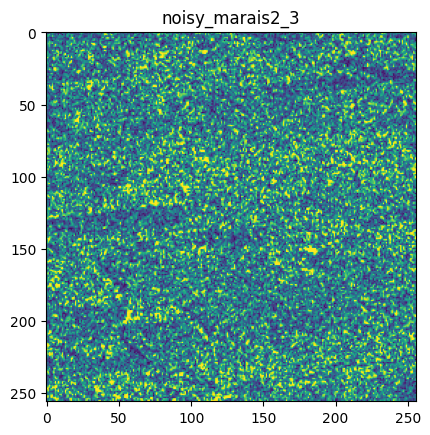

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_marais2_3.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_marais2_3.png'
img = mpimg.imread(image_path)

title = "noisy_marais2_3"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_marais2_4**

Shape of the array: (256, 256)
Content of the array: [[215.23773   77.73205   80.838875 ... 131.09937   98.875786  61.279892]
 [171.69415   65.035515  39.6275   ... 204.86523  100.39312   76.87467 ]
 [ 69.33136   69.09446  119.27778  ... 152.70241   45.43464   57.960682]
 ...
 [ 24.27056  109.43039   99.249435 ...  28.804815  53.90069   69.95608 ]
 [ 48.15487  167.69528   23.486542 ...  68.22602   89.306816  73.30348 ]
 [131.84703  166.5044   109.87367  ...  55.61153   38.77901   87.289375]]


(-0.5, 255.5, 255.5, -0.5)

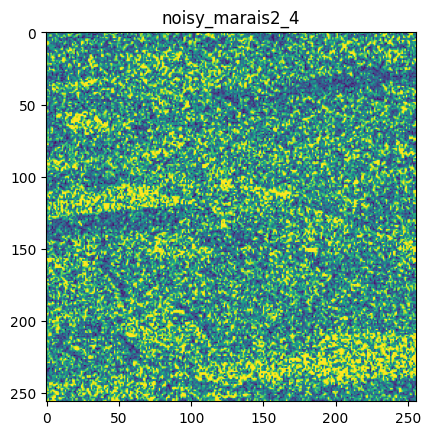

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_marais2_4.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_marais2_4.png'
img = mpimg.imread(image_path)

title = "noisy_marais2_4"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_marais2_5**

Shape of the array: (256, 256)
Content of the array: [[ 35.417118  44.33515   46.937443 ...  18.061987  48.332508  81.2162  ]
 [  9.379763  19.815205  69.0261   ...  55.66215   49.254044  44.58591 ]
 [ 41.96391   31.258385  83.14401  ...  44.062836 122.92178  162.38957 ]
 ...
 [ 42.598515  24.804377  81.52342  ...  33.96206   78.70761   51.886627]
 [ 73.61151    6.242624  44.02402  ...  34.083946  30.062302  93.75836 ]
 [ 96.118454  42.352814  41.815357 ...  37.970394  62.584732  79.19031 ]]


(-0.5, 255.5, 255.5, -0.5)

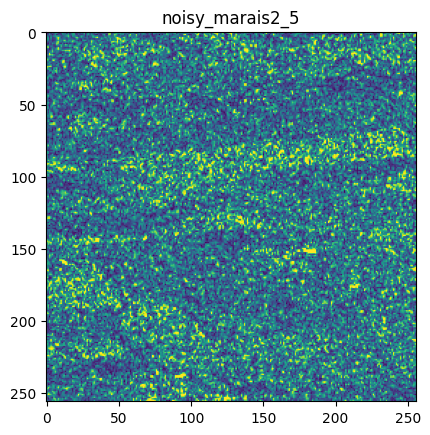

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_marais2_5.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_marais2_5.png'
img = mpimg.imread(image_path)

title = "noisy_marais2_5"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_ramb_1**

Shape of the array: (256, 256)
Content of the array: [[ 94.6215     93.15213    93.90324   ... 105.63395    89.46665
  159.80351  ]
 [ 27.118856   22.261671   54.148018  ...  20.503778   48.977917
   69.496796 ]
 [133.91898   117.603714  123.81595   ...  27.05762   165.44987
  242.6301   ]
 ...
 [136.03412   164.18144    58.135338  ...  57.066822   48.22323
   70.15002  ]
 [220.06201   265.846     240.05894   ...   4.1623373  30.61387
   60.085125 ]
 [194.50768   254.97835   253.07568   ...  69.35213    49.286015
   89.186554 ]]


(-0.5, 255.5, 255.5, -0.5)

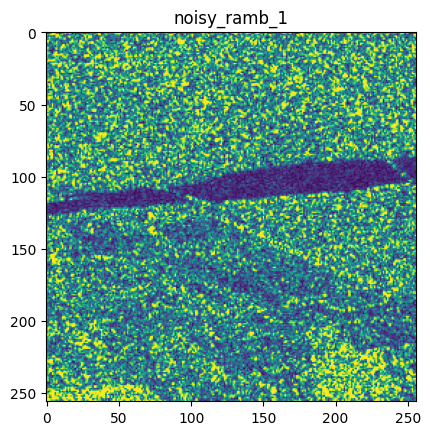

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_ramb_1.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_ramb_1.png'
img = mpimg.imread(image_path)

title = "noisy_ramb_1"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_ramb_2**

Shape of the array: (256, 256)
Content of the array: [[ 46.94066  115.59706  106.63102  ... 106.46154  116.232254  46.222218]
 [ 76.96476   74.1677    80.110016 ...  74.23974   62.50713   61.62902 ]
 [152.97017   44.2456     6.720208 ...  16.704815  92.994934  79.8165  ]
 ...
 [ 69.09927   68.566635  15.629081 ...  30.532436  28.187399  26.3282  ]
 [120.565414  78.32034   75.667465 ...  15.863399  37.646404  30.568447]
 [ 98.98958  154.85246  204.41032  ...  48.072346  67.73073   94.169136]]


(-0.5, 255.5, 255.5, -0.5)

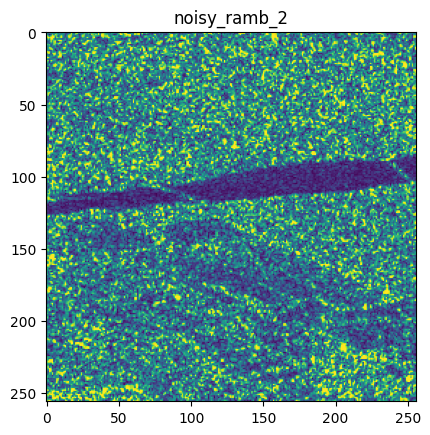

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_ramb_2.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_ramb_2.png'
img = mpimg.imread(image_path)

title = "noisy_ramb_2"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_ramb_3**

Shape of the array: (256, 256)
Content of the array: [[163.743    129.97151  130.23877  ...  29.848928  98.66705  115.13894 ]
 [ 56.689934  15.178491 104.213776 ...  91.138176 109.58589  108.44427 ]
 [122.59176  106.24023   51.88015  ...  82.77154  100.934364  81.83391 ]
 ...
 [ 95.44351   40.069443 121.11592  ...  45.97039   30.014519  53.593174]
 [188.33658  220.14493  227.23341  ...  32.11919   35.3953    51.09638 ]
 [132.73053  180.23344  217.32924  ...  65.341     96.78874  130.36665 ]]


(-0.5, 255.5, 255.5, -0.5)

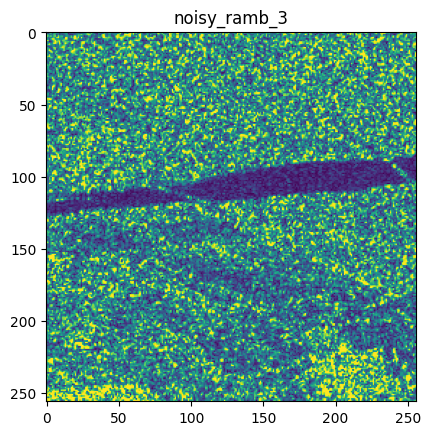

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_ramb_3.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_ramb_3.png'
img = mpimg.imread(image_path)

title = "noisy_ramb_3"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_ramb_4**

Shape of the array: (256, 256)
Content of the array: [[ 65.96354   113.569626   52.30887   ...  78.769264    0.9420409
  111.02887  ]
 [ 53.30937    84.12513    70.48317   ... 112.44054    11.457238
  161.8486   ]
 [110.71504    95.88407    53.691883  ...  51.78336    68.91921
   84.956764 ]
 ...
 [ 88.413284   59.185303  159.00511   ...  72.400505   59.55809
   32.760944 ]
 [192.4986    203.8765    209.93437   ...  89.43816    51.054317
   21.797068 ]
 [126.79024   144.81032   191.23404   ...  56.747055   16.308289
   44.101593 ]]


(-0.5, 255.5, 255.5, -0.5)

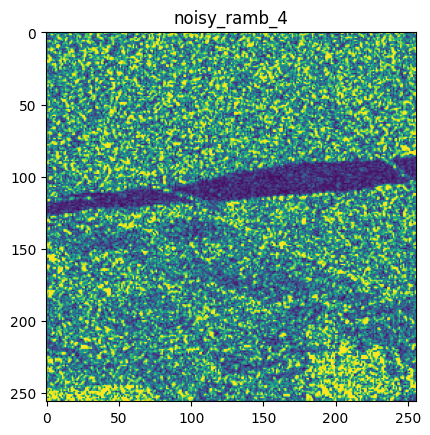

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_ramb_4.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_ramb_4.png'
img = mpimg.imread(image_path)

title = "noisy_ramb_4"
plt.imshow(img)
plt.title(title)
plt.axis('on')


# **noisy_ramb_5**

Shape of the array: (256, 256)
Content of the array: [[189.60838  157.18398   76.5208   ...  60.74291   58.430035 104.64391 ]
 [132.3873   128.60268   79.66395  ...  73.15424   80.514656  67.40043 ]
 [ 94.30404   50.551037  46.296486 ...  11.243252  28.82677   54.34116 ]
 ...
 [132.77458   73.034    100.71129  ...  21.43411    3.888968  61.013462]
 [153.83243  111.23001  101.01015  ...  57.050705  10.04851   70.02249 ]
 [ 78.005554  85.756134 144.76904  ...  67.081276  49.260853  89.21386 ]]


(-0.5, 255.5, 255.5, -0.5)

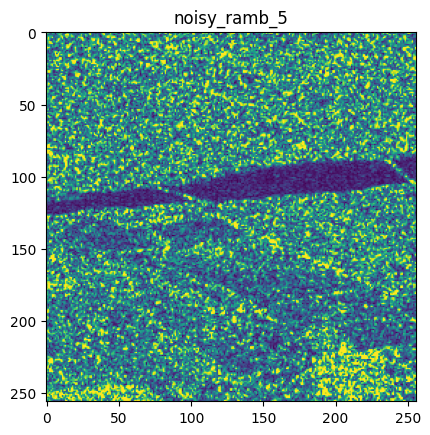

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


data = np.load('/content/test/noisy_ramb_5.npy')


print("Shape of the array:", data.shape)
print("Content of the array:", data)


image_path = '/content/test/noisy_ramb_5.png'
img = mpimg.imread(image_path)

title = "noisy_ramb_5"
plt.imshow(img)
plt.title(title)
plt.axis('on')
